In [1]:
# ! pip install nflows

In [2]:
import sys
sys.path.append('/home/lumargot/ShapeAXI/src')
from shapeaxi.saxi_dataset import SaxiDataModuleVF

/home/lumargot/.local/lib/python3.9/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [3]:
from diffusers import FlowMatchEulerDiscreteScheduler

In [ ]:
import os
import torch
from torch import nn
from pytorch3d.ops import sample_points_from_meshes
import numpy as np

import plotly.graph_objects as go
import plotly.express as px
from pytorch3d.vis.plotly_vis import plot_scene
from pytorch3d.structures import (
    Meshes,
    Pointclouds,)
    
import sys
sys.path.append('/home/lumargot/ShapeAXI/src')
from shapeaxi.saxi_dataset import SaxiDataModuleVF
import pandas as pd

In [ ]:
batch_size = 1
dm = SaxiDataModuleVF(
    csv_train="/CMF/data/lumargot/DCBIA/Combined/csv/condyles_4classes_consensus_Marcela_train_fold0_train_train.csv",
    csv_valid="/CMF/data/lumargot/DCBIA/Combined/csv/condyles_4classes_consensus_Marcela_train_fold0_train_test.csv",
    csv_test="/CMF/data/lumargot/DCBIA/Combined/csv/condyles_4classes_consensus_Marcela_train_fold0_test.csv",
    mount_point="",
    batch_size=batch_size,
    num_workers=1,
    surf_column="surf",
    drop_last=False,
    
    )
dm.setup()

In [6]:
# import hilbertsort as hs

In [7]:
train_loader = dm.train_dataloader()

In [30]:
V, F = next(iter(train_loader))

img_height = 128
N = img_height*img_height
mesh_batch = Meshes(verts=V, faces=F)

P = sample_points_from_meshes(mesh_batch, N)

pc_orig = Pointclouds(points=P)

In [ ]:
pc_orig = Pointclouds(points=P)
orig_pc_d = {}
for idx in range(V.shape[0]):
    orig_pc_d[idx] = {idx: pc_orig[idx]}

fig = plot_scene(
    orig_pc_d,
    ncols=batch_size
)
fig.show()

In [10]:
from shapeaxi.saxi_nets import HilbertSort3D

In [32]:
P.shape

torch.Size([4, 16384, 3])

In [38]:

sorter_pt = HilbertSort3D(radius=1.25, bins=img_height)

p_sorted_pt = sorter_pt(P)[0]


In [41]:
p_rgb.shape

(16, 64, 64, 3)


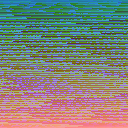
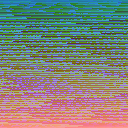
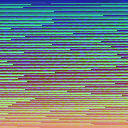
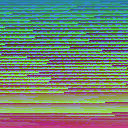
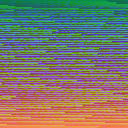

In [42]:
p_rgb = p_sorted_pt.view(-1, img_height, img_height, 3).detach().cpu().numpy()
p_rgb = p_rgb - p_rgb.min()
p_rgb = p_rgb / p_rgb.max()
px.imshow(p_rgb, binary_string=True, animation_frame=0)

In [36]:

pc = Pointclouds(points=p_sorted_pt[0:4])

pc_d = {}
for idx in range(len(pc.points_list())):
    pc_d[idx] = {idx: pc[idx]}

fig = plot_scene(
    pc_d,
    ncols=len(pc.points_list())
)
fig.show()